# Dataset Preperation

In [1]:
import pandas as pd
import numpy as np

path_1="datasets/UNH.csv"
path_2="datasets/PFE.csv"
path_3="datasets/MRK.csv"

asset_1 = pd.read_csv(path_1)
asset_2 = pd.read_csv(path_2)
asset_3 = pd.read_csv(path_3)

asset_1["Date"] = pd.to_datetime(asset_1["Date"]).dt.strftime("%Y-%m-%d")
asset_2["Date"] = pd.to_datetime(asset_2["Date"]).dt.strftime("%Y-%m-%d")
asset_3["Date"] = pd.to_datetime(asset_3["Date"]).dt.strftime("%Y-%m-%d")

asset_labels=["UNH","PFE","MRK"]

start_date="2023-08-23"
start_date = pd.to_datetime(start_date).strftime("%Y-%m-%d")
# Find the index of the start_date in the asset data
start_index = asset_1.loc[asset_1["Date"] == start_date].index[0]

# Slice the historical data from start_date onwards
historical_prices_1 = asset_1["Close"].iloc[start_index:].values
historical_prices_2 = asset_2["Close"].iloc[start_index:].values
historical_prices_3 = asset_3["Close"].iloc[start_index:].values
historical_prices = np.column_stack([historical_prices_1, historical_prices_2, historical_prices_3])
S0 = historical_prices[0, :]
barrier = S0 * 0.59
print(f"Price at initial fixing date: {S0}")
print(f"Barrier Price: {barrier}")

Price at initial fixing date: [480.22924805  34.61804962 107.69082642]
Barrier Price: [283.33525635  20.42464928  63.53758759]


# Model

### Multi-Asset Black-Scholes Model

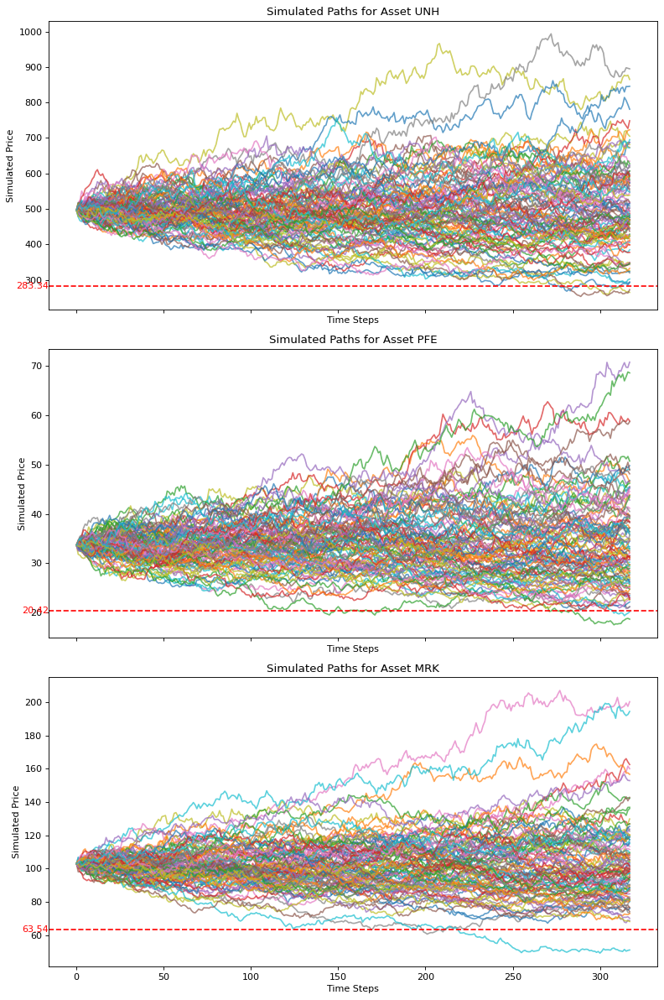

In [2]:
from GBM import MultiBS

multi_bs = MultiBS()
M=100_000
forward_simulation = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M)
v, sigma = multi_bs.calibrate_model(forward_simulation)
simul = multi_bs.simulate_multi_GBM_exact(m=317, M=100)
multi_bs.plot(simul)

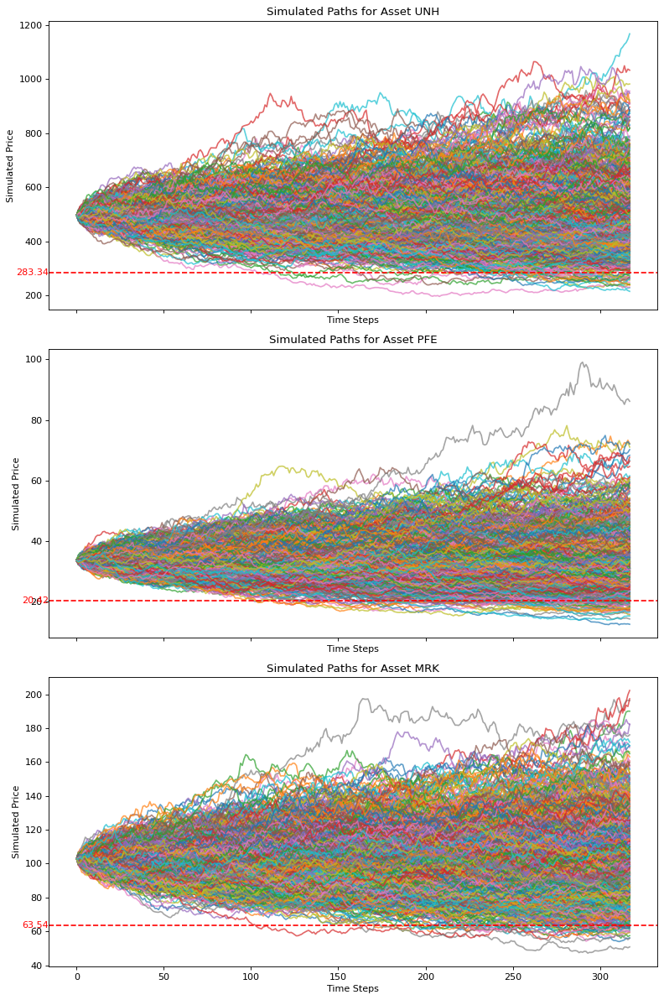

Variance of the final price for asset 1: 18161.296343694
Variance of the final price for asset 2: 89.98856086472017
Variance of the final price for asset 3: 554.8596099359736


array([[2.21916304e-04, 6.81643847e-05, 5.07584653e-05],
       [6.81643847e-05, 2.33221768e-04, 6.33790807e-05],
       [5.07584653e-05, 6.33790807e-05, 1.59414580e-04]])

In [3]:
simul = multi_bs.simulate_multi_GBM_exact(m=317, M=1000)
multi_bs.plot(simul)
for i in range(3):
    print(f"Variance of the final price for asset {i+1}: {np.var(simul[:, -1,:][i])}")
log_returns = np.log(simul[:, 1:, :] / simul[:, :-1, :])  # Shape: (num_assets, num_steps-1, num_paths)

# Reshape the log returns to 2D: (num_assets, (num_steps-1) * num_paths)
log_returns_reshaped = log_returns.reshape(3, -1).T

# Calculate the covariance matrix
cov_matrix = np.cov(log_returns_reshaped, rowvar=False)
cov_matrix

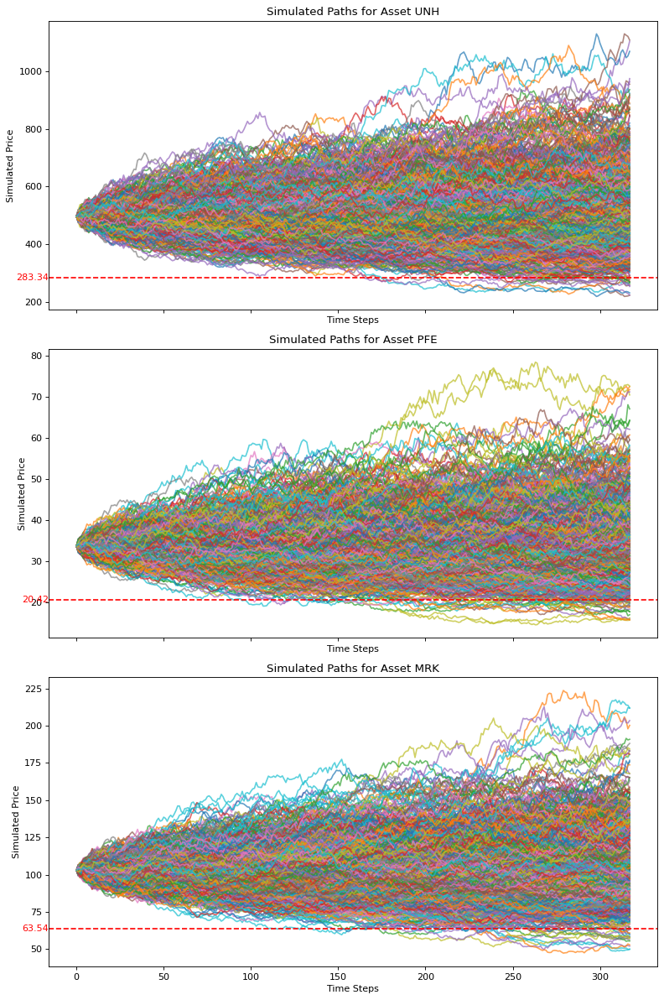

Variance of the final price for asset 1: 2330.6597937262077
Variance of the final price for asset 2: 10.04530952072337
Variance of the final price for asset 3: 63.175485384267446


array([[2.21197779e-04, 6.99384587e-05, 5.02902007e-05],
       [6.99384587e-05, 2.36061344e-04, 6.49326789e-05],
       [5.02902007e-05, 6.49326789e-05, 1.59784956e-04]])

In [4]:
simul = multi_bs.simulate_multi_GBM_antithetic(m=317, M=1000)
multi_bs.plot(simul)
x = simul[:,:,:500] + simul[:,:,500:] 
for i in range(3):
    print(f"Variance of the final price for asset {i+1}: {np.var(x[:, -1,:][i])}")

log_returns = np.log(simul[:, 1:, :] / simul[:, :-1, :])  # Shape: (num_assets, num_steps-1, num_paths)

# Reshape the log returns to 2D: (num_assets, (num_steps-1) * num_paths)
log_returns_reshaped = log_returns.reshape(3, -1).T

# Calculate the covariance matrix
cov_matrix = np.cov(log_returns_reshaped, rowvar=False)
cov_matrix

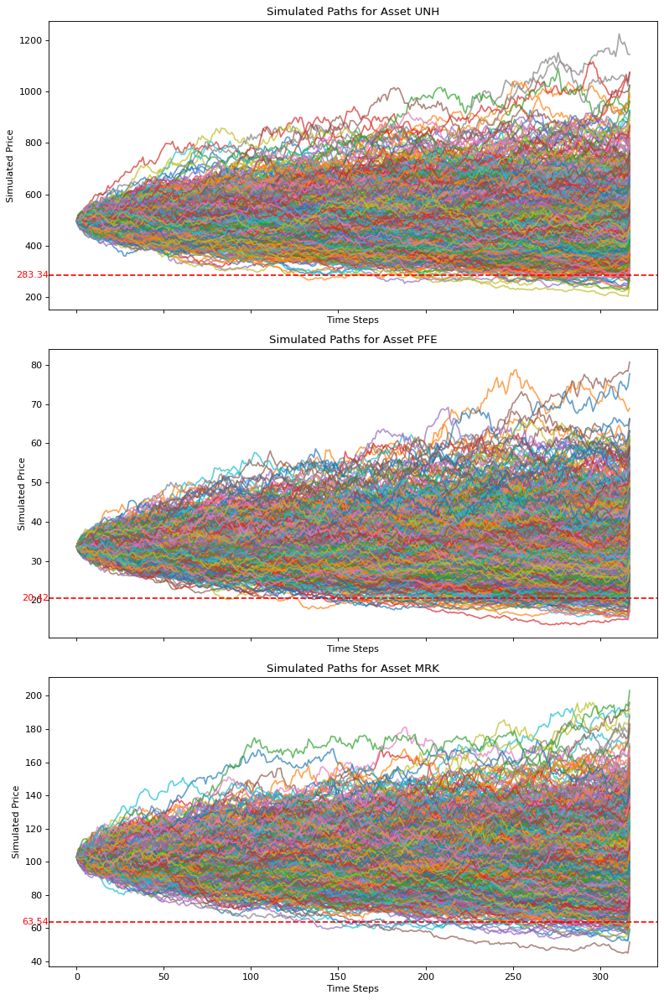

Variance of the final price for asset 1: 17953.665481906053
Variance of the final price for asset 2: 82.715395017704
Variance of the final price for asset 3: 519.5575862950558


array([[2.38266825e-04, 8.48265404e-05, 6.68034529e-05],
       [8.48265404e-05, 2.51838342e-04, 8.01671571e-05],
       [6.68034529e-05, 8.01671571e-05, 1.75258461e-04]])

In [5]:
simul = multi_bs.simulate_multi_GBM_control_variate(m=317, M=1000)
multi_bs.plot(simul)
for i in range(3):
    print(f"Variance of the final price for asset {i+1}: {np.var(simul[:, -1,:][i])}")
log_returns = np.log(simul[:, 1:, :] / simul[:, :-1, :])  # Shape: (num_assets, num_steps-1, num_paths)

# Reshape the log returns to 2D: (num_assets, (num_steps-1) * num_paths)
log_returns_reshaped = log_returns.reshape(3, -1).T

# Calculate the covariance matrix
cov_matrix = np.cov(log_returns_reshaped, rowvar=False)
cov_matrix

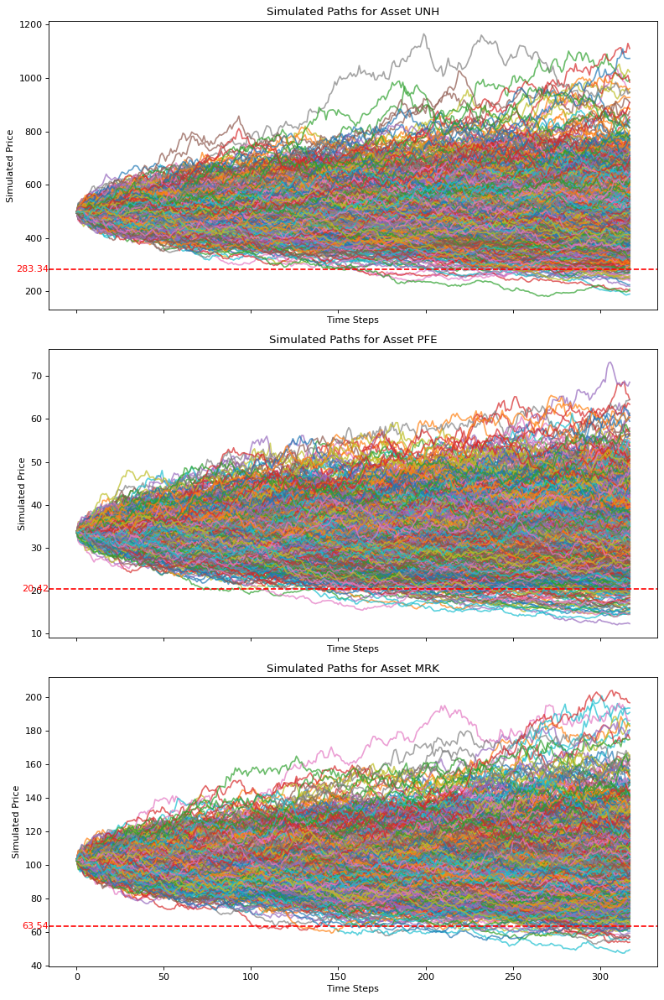

Variance of the final price for asset 1: 18472.508652426688
Variance of the final price for asset 2: 86.53455474490224
Variance of the final price for asset 3: 521.348876766163


array([[2.22168042e-04, 6.83464735e-05, 5.06932625e-05],
       [6.83464735e-05, 2.34126150e-04, 6.38199494e-05],
       [5.06932625e-05, 6.38199494e-05, 1.59609257e-04]])

In [6]:
simul = multi_bs.simulate_multi_GBM_stratified(m=317, M=1000)
multi_bs.plot(simul)
for i in range(3):
    print(f"Variance of the final price for asset {i+1}: {np.var(simul[:, -1,:][i])}")
log_returns = np.log(simul[:, 1:, :] / simul[:, :-1, :])  # Shape: (num_assets, num_steps-1, num_paths)

# Reshape the log returns to 2D: (num_assets, (num_steps-1) * num_paths)
log_returns_reshaped = log_returns.reshape(3, -1).T

# Calculate the covariance matrix
cov_matrix = np.cov(log_returns_reshaped, rowvar=False)
cov_matrix

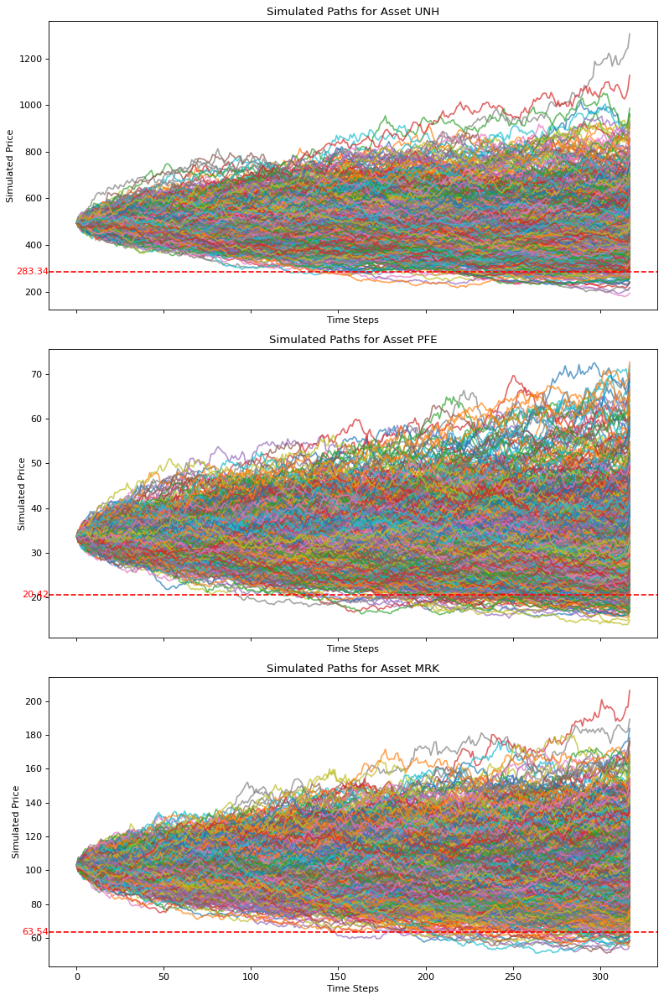

Variance of the final price for asset 1: 19369.408044175954
Variance of the final price for asset 2: 99.77606382341338
Variance of the final price for asset 3: 560.4941987923517


array([[2.29771689e-04, 7.78774295e-05, 5.60329742e-05],
       [7.78774295e-05, 2.43915427e-04, 6.98255446e-05],
       [5.60329742e-05, 6.98255446e-05, 1.63181672e-04]])

In [7]:
simul = multi_bs.simulate_multi_GBM_importance_sampling(m=317, M=1000)
multi_bs.plot(simul)
for i in range(3):
    print(f"Variance of the final price for asset {i+1}: {np.var(simul[:, -1,:][i])}")

log_returns = np.log(simul[:, 1:, :] / simul[:, :-1, :])  # Shape: (num_assets, num_steps-1, num_paths)

# Reshape the log returns to 2D: (num_assets, (num_steps-1) * num_paths)
log_returns_reshaped = log_returns.reshape(3, -1).T

# Calculate the covariance matrix
cov_matrix = np.cov(log_returns_reshaped, rowvar=False)
cov_matrix

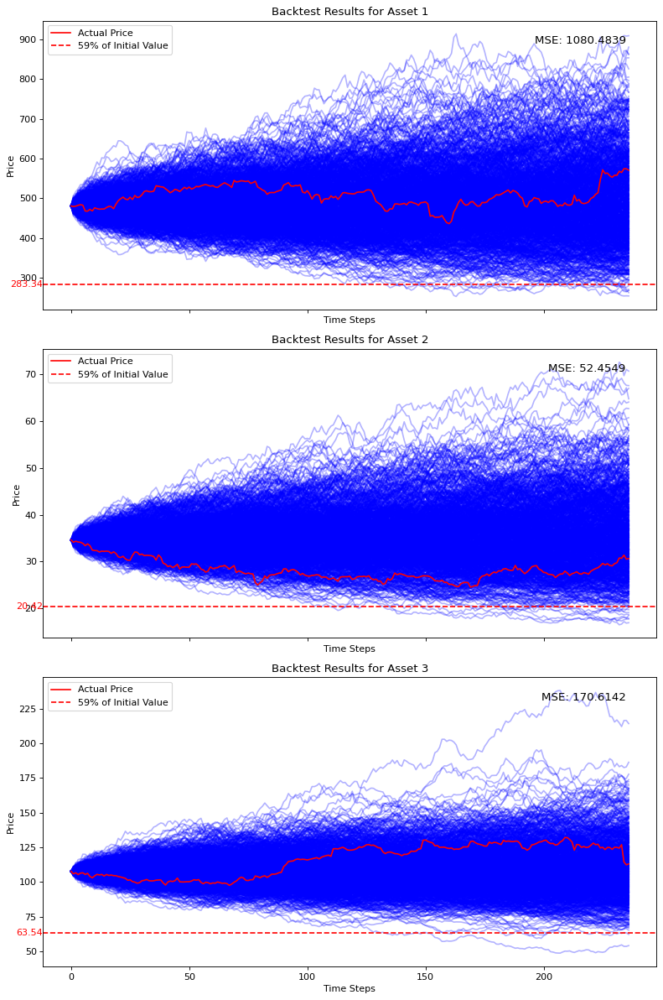

Mean Squared Error (MSE) for each asset: [1080.48392985   52.45492847  170.61424352]
Root Mean Squared Error (RMSE) for each asset: [32.87071538  7.24257747 13.06193874]


array([1080.48392985,   52.45492847,  170.61424352])

In [8]:
multi_bs.backtest(M=1000)

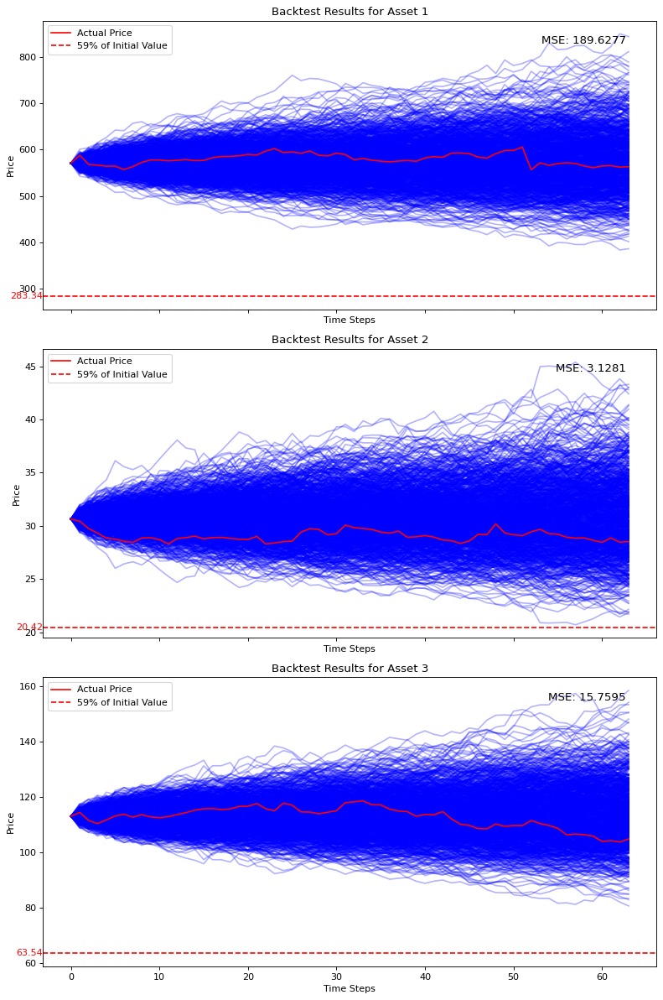

Mean Squared Error (MSE) for each asset: [189.62773502   3.12805846  15.75950715]
Root Mean Squared Error (RMSE) for each asset: [13.77053866  1.7686318   3.96982457]


array([189.62773502,   3.12805846,  15.75950715])

In [9]:
multi_bs.backtest(M=1000, start_date="2024-08-01", end_date="2024-10-30")

### Heston Model

In [10]:
import torch
from heston_model import HestonModel


standard_normal = torch.distributions.Normal(torch.tensor([0]), 1)
s0 = torch.tensor([489.44, 36.65, 111])
r = 0.0419
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
standard_normal = torch.distributions.Normal(torch.tensor([0]).to(device), torch.tensor([1]).to(device))
S0 = torch.tensor(S0)
barrier = 0.59 * S0

r = 0.0419
heston = HestonModel()

In [160]:
params, cov = heston.MLE()
sobol = torch.quasirandom.SobolEngine(3 * 2 * 317)
uni = sobol.draw(512).reshape(512,3,-1,2).to(device)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0)

c:\Users\JHong\Documents\GitHub\MH4518\heston_model.py:251: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['vol_gain_UNH'] = data[f'yz_var_UNH'].diff()
c:\Users\JHong\Documents\GitHub\MH4518\heston_model.py:252: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['vol_gain_PFE'] = data[f'yz_var_PFE'].diff()
c:\Users\JHong\Documents\GitHub\MH4518\heston_model.py:253: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value 

In [ ]:
import matplotlib.pyplot as plt
def plot(simulated_data, show_barrier=True, barrier=barrier, asset_labels=["UNH","PFE","MRK"]):
    if simulated_data is None:
        raise ValueError('No simulated data available. Run the simulation first.')

    p, m, M = simulated_data.shape  # number of assets, time steps, number of paths

    # Create subplots for each asset
    fig, axes = plt.subplots(p, 1, figsize=(10, 5 * p), dpi=80, sharex=True)

    for i in range(p):
        ax = axes[i] if p > 1 else axes  # Select the appropriate axis if p > 1
        # Plot each path for asset i
        ax.plot(simulated_data[i], alpha=0.7)
        if show_barrier:
            ax.axhline(y=barrier[i], color='red', linestyle='--', label='59% of Initial Value')
            ax.annotate(f'{barrier[i]:.2f}', xy=(0, barrier[i]),
                    xytext=(-30, 0), textcoords='offset points',
                    color='red', fontsize=10, va='center', ha='right')
        ax.set_title(f'Simulated Paths for Asset: {asset_labels[i]}')
        ax.set_xlabel('Time Steps')
        ax.set_ylabel('Simulated Price')

    plt.tight_layout()
    plt.show()


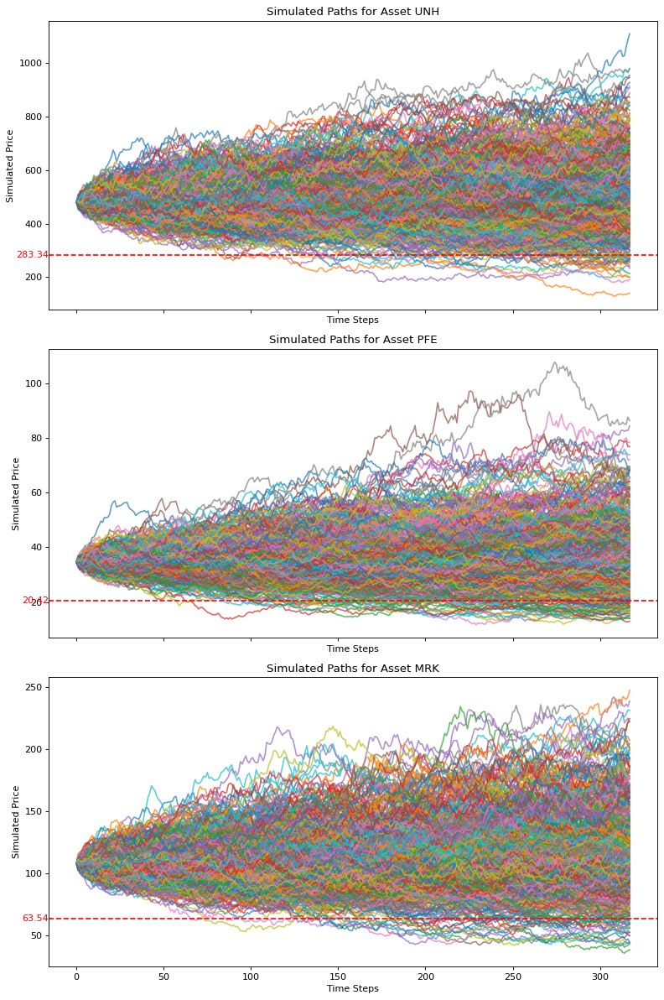

In [161]:
plot(torch.exp(path[1:,:,:,0].permute(1, 2, 0).cpu().detach()))

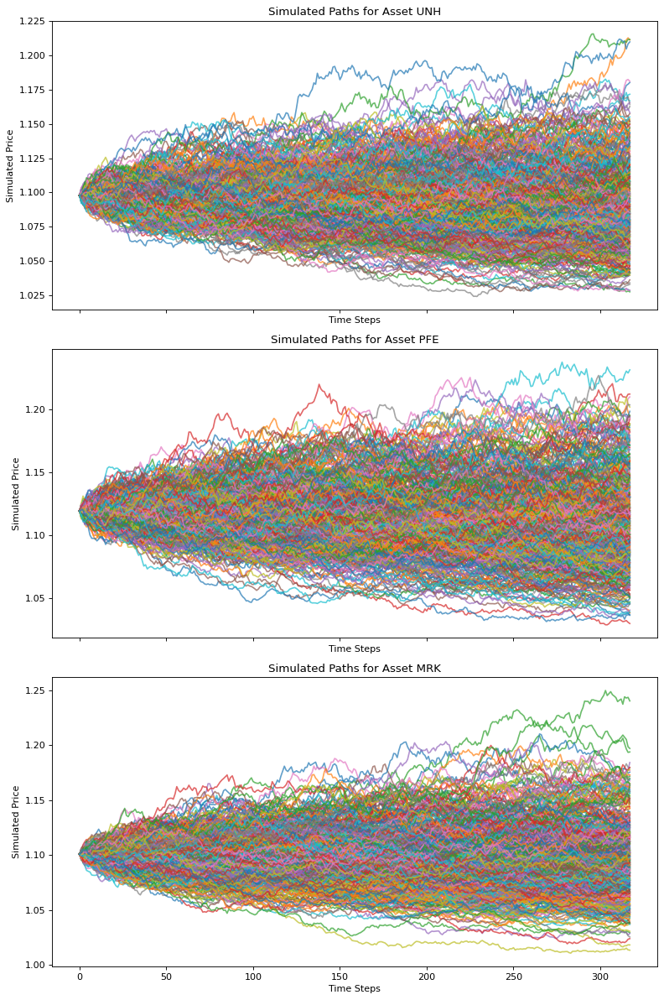

In [14]:
plot(torch.exp(path[1:,:,:,1].permute(1, 2, 0).cpu().detach()), show_barrier=False)

In [15]:
def get_historical_prices(start_date="2023-08-23", end_date="2024-08-01"):
    start_date = pd.to_datetime(start_date).strftime("%Y-%m-%d")
    # Find the index of the start_date in the asset data
    start_index = asset_1.loc[asset_1["Date"] == start_date]["Close"].index[0]

    # Convert the end_date to a pandas datetime format
    end_date = pd.to_datetime(end_date).strftime("%Y-%m-%d")
    # Find the index of the end_date in the asset data
    end_index = asset_1.loc[asset_1["Date"] == end_date]["Close"].index[0]

    # Slice the historical data from start_date onwards
    historical_prices_1 = asset_1["Close"].iloc[start_index:end_index+1].values
    historical_prices_2 = asset_2["Close"].iloc[start_index:end_index+1].values
    historical_prices_3 = asset_3["Close"].iloc[start_index:end_index+1].values
    historical_prices = np.column_stack([historical_prices_1, historical_prices_2, historical_prices_3])
    return (end_index - start_index), historical_prices

In [33]:
# Plotting function for backtesting
def plot_backtest_results(simulated_data, historical_prices, asset_labels=["UNH","PFE","MRK"], barrier=None, show_barrier=False):
    p, m, M = simulated_data.shape  # number of assets, time steps, number of paths
    mse = np.mean((simulated_data[:, :len(historical_prices), :].mean(axis=2) - historical_prices.T) ** 2, axis=1)

    # Create subplots for each asset
    fig, axes = plt.subplots(p, 1, figsize=(10, 5 * p), dpi=80, sharex=True)
        
    for i in range(p):
        ax = axes[i] if p > 1 else axes  # Select the appropriate axis if p > 1
        # Plot each simulated path for asset i
        for path in range(M):
            ax.plot(simulated_data[i, :, path], color='blue', alpha=0.3)
        # Plot the actual historical price path for asset i
        ax.plot(historical_prices[:, i], color='red', label="Actual Price")
        ax.annotate(f'MSE: {mse[i]:.4f}', xy=(0.95, 0.95), xycoords='axes fraction', horizontalalignment='right', verticalalignment='top', fontsize=12)
        if show_barrier and barrier is not None:
            ax.axhline(y=barrier[i], color='red', linestyle='--', label='59% of Initial Value')
            ax.annotate(f'{barrier[i]:.2f}', xy=(0, barrier[i]),
                    xytext=(-30, 0), textcoords='offset points',
                    color='red', fontsize=10, va='center', ha='right')
        ax.set_title(f'Backtest Results for Asset: {asset_labels[i]}')
        ax.set_xlabel('Time Steps')
        ax.set_ylabel('Price')
        ax.legend(loc='upper left')
    
    plt.tight_layout()
    plt.show()

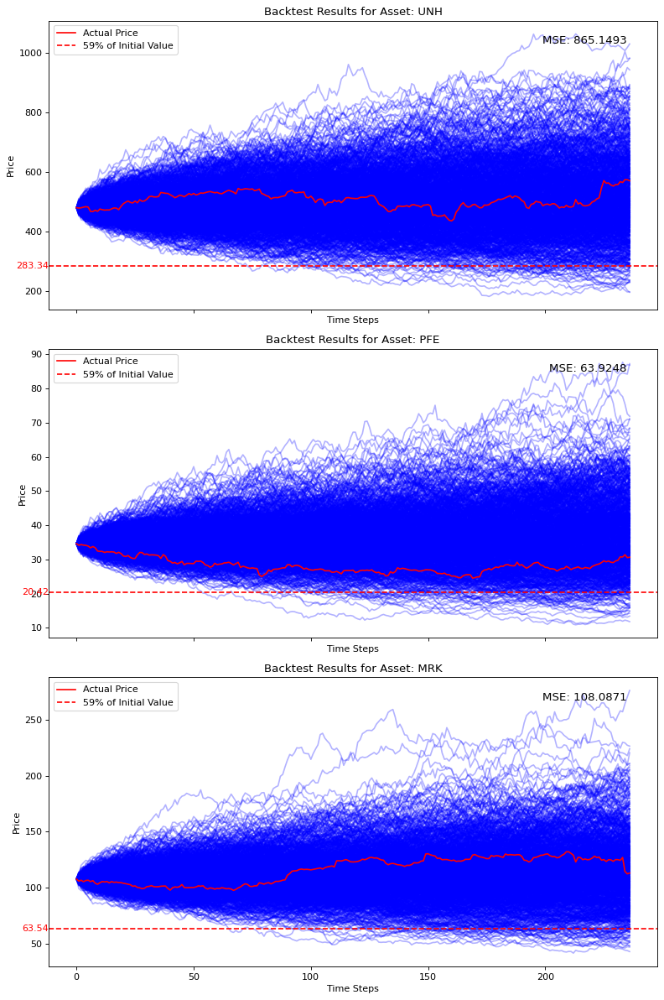

In [34]:
T, s0 = get_historical_prices()
sobol = torch.quasirandom.SobolEngine(3 * 2 * T)
uni = sobol.draw(1_000).reshape(1_000,3,-1,2).to(device)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, torch.tensor(s0[0]).to(device))
plot_backtest_results(simulated_data=torch.exp(path[1:,:,:,0].permute(1, 2, 0)).cpu().numpy(), historical_prices=s0, barrier=barrier, show_barrier=True)

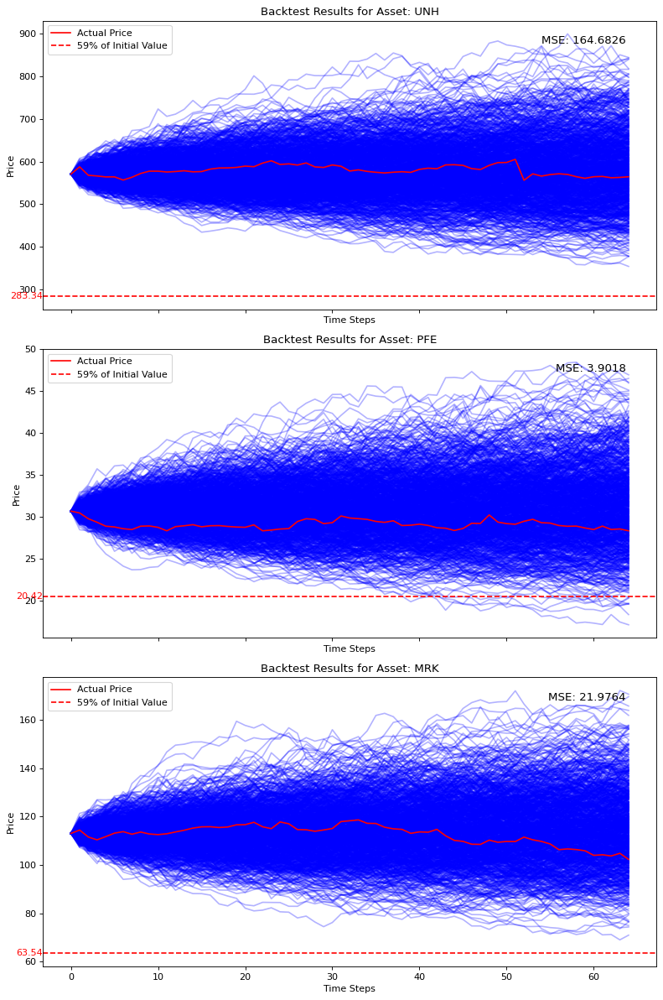

In [35]:
T, s0 = get_historical_prices(start_date="2024-08-01", end_date="2024-10-31")
sobol = torch.quasirandom.SobolEngine(3 * 2 * T)
uni = sobol.draw(1_000).reshape(1_000,3,-1,2).to(device)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, torch.tensor(s0[0]).to(device))
plot_backtest_results(simulated_data=torch.exp(path[1:,:,:,0].permute(1, 2, 0)).cpu().numpy(), historical_prices=s0, barrier=barrier, show_barrier=True)

### DCC-GARCH Model

In [19]:
from process_data import GARCH
garch = GARCH()
garch.fit(True)
m = 317
forecast = garch.forecast(m, num_paths=1_000)

c:\Users\JHong\Documents\GitHub\MH4518\process_data.py:78: RuntimeWarning: invalid value encountered in scalar divide
  Omega = Omega + iota_norm**-1 * (-1 + denom * (k - 1) / num) * iota @ iota.T
C:\Users\JHong\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\numpy\linalg\linalg.py:2180: RuntimeWarning: invalid value encountered in det
  r = _umath_linalg.det(a, signature=signature)
c:\Users\JHong\Documents\GitHub\MH4518\process_data.py:80: RuntimeWarning: invalid value encountered in sqrt
  xi = -np.sqrt(nu / np.pi) * (g1 / g2) * (Omega @ iota) / np.sqrt(1 + iota.T @ Omega @ iota)
c:\Users\JHong\Documents\GitHub\MH4518\process_data.py:81: RuntimeWarning: invalid value encountered in log
  loss = (len(shocks) - 1) * (np.log(sp.special.gamma((nu + 3) / 2)) - 0.5 * np.log(np.linalg.det(Omega)) \


Optimised parameters:
a: 0.7349502742816074
b: 0.002637722355226774
nu: 2.0016082308704406
iota: [[-1.1370089 ]
 [ 0.85042592]
 [ 0.95195043]]


C:\Users\JHong\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\scipy\stats\_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


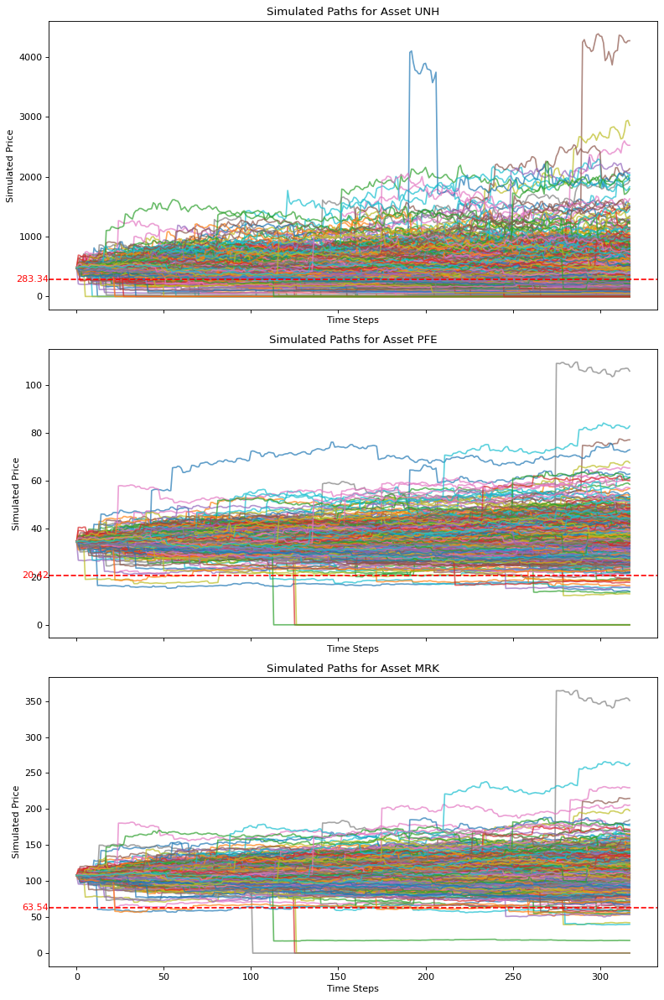

In [20]:
plot(forecast.transpose(1, 2, 0))

C:\Users\JHong\AppData\Local\Temp\ipykernel_33932\63513931.py:1: RuntimeWarning: divide by zero encountered in log
  plot(np.log(forecast.transpose(1, 2, 0)), show_barrier=False)


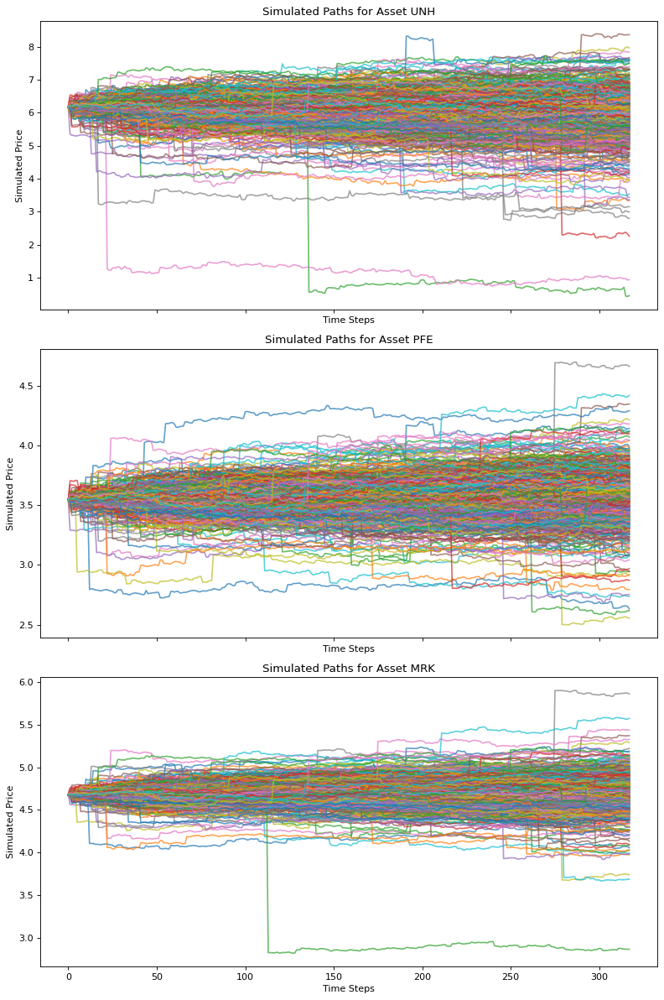

In [21]:
plot(np.log(forecast.transpose(1, 2, 0)), show_barrier=False)

C:\Users\JHong\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\scipy\stats\_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


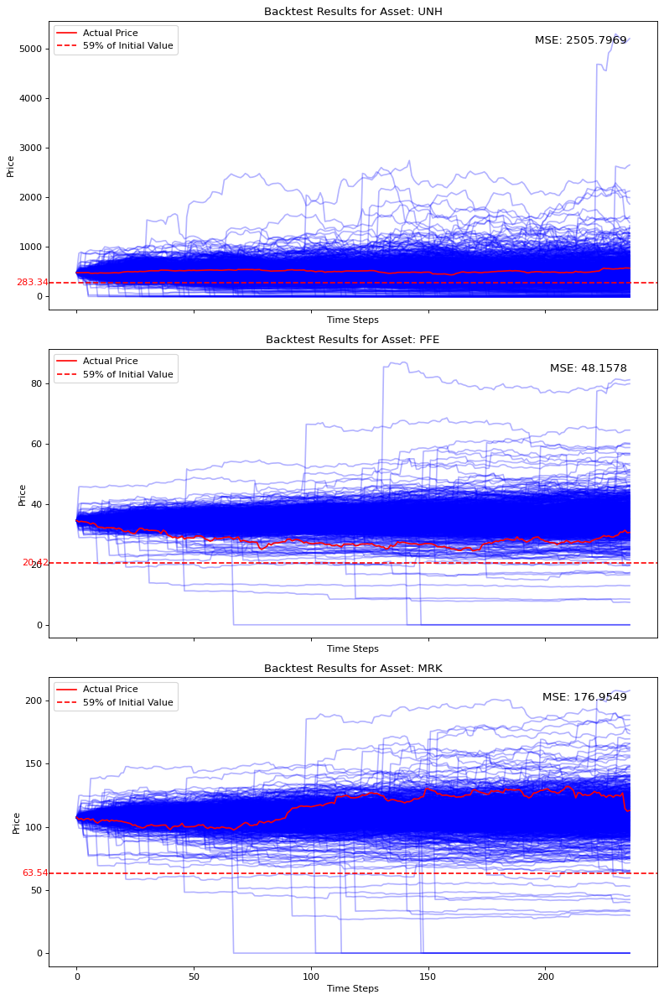

In [ ]:
M = 1_000
T, s0 = get_historical_prices()
forecast = garch.forecast(T, M, s0[0])
plot_backtest_results(simulated_data=forecast.transpose(1, 2, 0), historical_prices=s0, barrier=barrier, show_barrier=True)

C:\Users\JHong\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\scipy\stats\_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


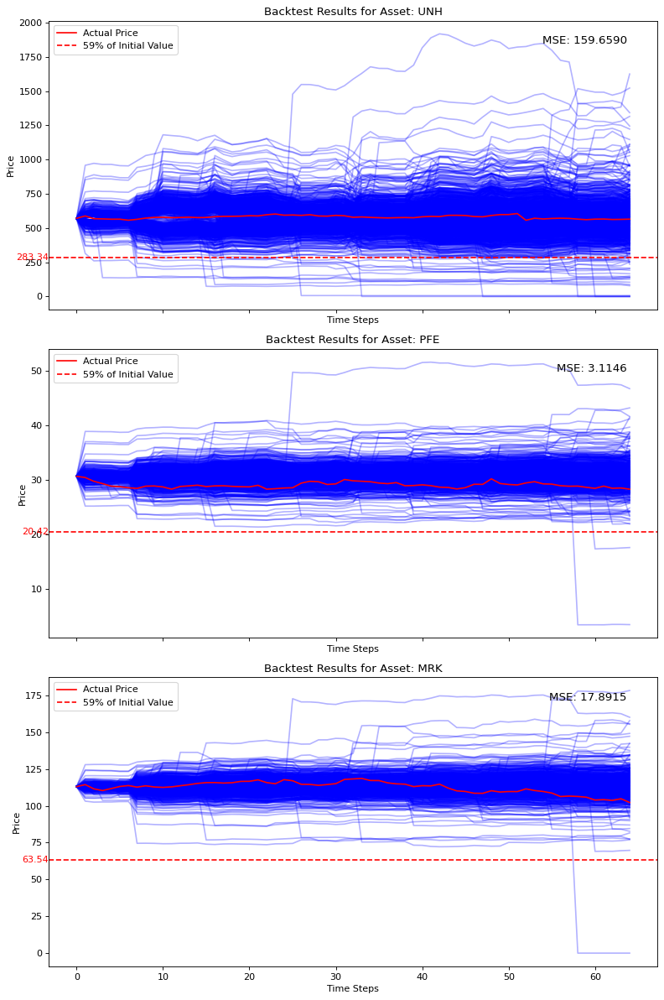

In [38]:
M = 1_000
T, s0 = get_historical_prices(start_date="2024-08-01", end_date="2024-10-31")
forecast = garch.forecast(T, M, s0[0])
plot_backtest_results(simulated_data=forecast.transpose(1, 2, 0), historical_prices=s0, barrier=barrier, show_barrier=True)

# Evaluating Payoff

### Under Black-Scholes Model

Training the callable payoff function

In [24]:
from payoff import CallablePayoff
from tqdm import tqdm

S0 = historical_prices[0,:]
bs_payoff = CallablePayoff(0, r=0.0419, S0=S0)
M = 10_000
epochs = 200
with tqdm(total=epochs, desc="Training Progress") as pbar:
    for epoch in range(epochs):
        path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0) # 317 business days from initial fixing to final fixing
        path = np.log(path) # in asset, timestep, path
        # (path #, asset #, timestep #)
        path = path.transpose(2, 0, 1)
        losses = bs_payoff.minimise_over_path(path)
        pbar.set_postfix({'Worst loss': max(losses), 
                            'Best Loss': min(losses)})
        pbar.update(1)


Training Progress: 100%|██████████| 200/200 [00:58<00:00,  3.40it/s, Worst loss=5.51e+3, Best Loss=5.46e+3]


In [25]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0)
path = np.log(path) 
path = path.transpose(2, 0, 1)
returns = bs_payoff.evaluate_payoff(path, True)
print(f"Expected Payoff: {x.mean()}")

Expected Payoff: 428.88136079430575


In [26]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0)
path = np.log(path) 
path = path.transpose(2, 0, 1)
x = bs_payoff.evaluate_payoff(path, False)
print(f"Expected Payoff: {x.mean()}")

Expected Payoff: 1032.2444095517571


In [92]:
import matplotlib.pyplot as plt
calling_dates = [129, 189, 254]
payoff_dates = [70, 132, 193, 257, 321]

def plot_backtest_results(payout, calling_dates=calling_dates, payoff_dates=payoff_dates):
    plt.figure(figsize=(30, 6))
    plt.plot(payout)
    plt.xlabel("Days from Initial Fixing Date")
    plt.ylabel("Expected Payoff")

    for calling_date in calling_dates:
        plt.axvline(x=calling_date, color='red', linestyle='--', label='Call Date')
    for payoff_date in payoff_dates:
        plt.axvline(x=payoff_date, color='green', linestyle='--', label='Payoff Date')
        
    plt.title("Expected Payoff over Time")
    plt.show()

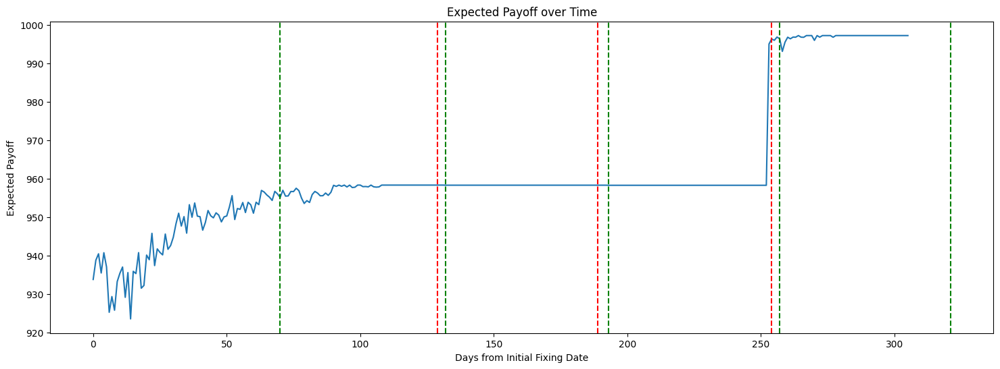

In [70]:
payout_bs = []
bs_payoff.current_date = 0
t = 0
for j in range(317, 317 - len(historical_prices), -1):
    s0 = historical_prices[t, :]
    t += 1
    historical_data = np.expand_dims(historical_prices[:t,].cpu(), axis=0).repeat(M, axis=0).transpose(2,1,0)
    bs_payoff.current_date += 1
    path = multi_bs.simulate_multi_GBM_antithetic(m=j, M=M, S0=s0.cpu())
    path = np.concatenate([historical_data, path], axis=1)
    path = np.log(path) 
    path = path.transpose(2, 0, 1)
    expected_payoff = bs_payoff.evaluate_payoff(path, True).mean()
    payout_bs.append(expected_payoff.item())

plot_backtest_results(payout_bs)

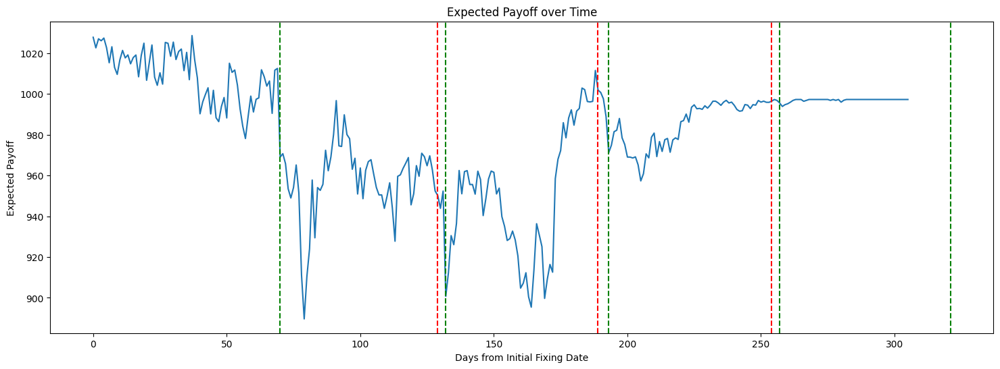

In [73]:
payout_bs_nc = []
bs_payoff.current_date = 0
t = 0
for j in range(317, 317 - len(historical_prices), -1):
    s0 = historical_prices[t, :]
    t += 1
    historical_data = np.expand_dims(historical_prices[:t,].cpu(), axis=0).repeat(M, axis=0).transpose(2,1,0)
    bs_payoff.current_date += 1
    path = multi_bs.simulate_multi_GBM_antithetic(m=j, M=M, S0=s0.cpu())
    path = np.concatenate([historical_data, path], axis=1)
    path = np.log(path) 
    path = path.transpose(2, 0, 1)
    expected_payoff = bs_payoff.evaluate_payoff(path, False).mean()
    payout_bs_nc.append(expected_payoff.item())

plot_backtest_results(payout_bs_nc)

### Under Heston Model

In [149]:
from payoff import CallablePayoff
from tqdm import tqdm

sobol = torch.quasirandom.SobolEngine(3 * 2 * 317)

params, cov = heston.MLE()
S0 = torch.tensor(S0).to(device=device)
heston_payoff = CallablePayoff(0, 0.0419, S0)
epochs = 1000

with tqdm(total=epochs, desc="Training Progress") as pbar:
    for epoch in range(epochs):
        
        uni = sobol.draw(512).reshape(512,3,-1,2).to(device)
        u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
        path = heston.multi_asset_path(u, uni, params, r, cov, S0)
        losses = heston_payoff.minimise_over_path(path[:,:,:,0])
        
        pbar.set_postfix({'Worst loss': max(losses), 
                          'Best Loss': min(losses)})
        pbar.update(1)

c:\Users\JHong\Documents\GitHub\MH4518\heston_model.py:251: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['vol_gain_UNH'] = data[f'yz_var_UNH'].diff()
c:\Users\JHong\Documents\GitHub\MH4518\heston_model.py:252: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['vol_gain_PFE'] = data[f'yz_var_PFE'].diff()
c:\Users\JHong\Documents\GitHub\MH4518\heston_model.py:253: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value 

In [163]:
uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0)
returns = heston_payoff.evaluate_payoff(path[:,:,:,0], True)
mean_return = returns.mean()
print(f"Expected Payoff (Mean): {mean_return}")

# Filter and print returns that are not equal to the mean
non_mean_returns = returns[returns != mean_return]
print(non_mean_returns)

Expected Payoff (Mean): 884.2328490445683
tensor([997.2439, 997.2439, 997.2439,  ..., 997.2439, 997.2439, 733.6442],
       device='cuda:0')


In [162]:
uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0)
returns = heston_payoff.evaluate_payoff(path[:,:,:,0], False)
mean_return = returns.mean()
print(f"Expected Payoff (Mean): {mean_return}")

# Filter and print returns that are not equal to the mean
non_mean_returns = returns[returns != mean_return]
print(non_mean_returns)

Expected Payoff (Mean): 884.7268540205688
tensor([484.0007, 997.2439, 997.2439,  ..., 570.7299, 997.2439, 997.2439],
       device='cuda:0')


c:\Users\JHong\Documents\GitHub\MH4518\payoff.py:72: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.tensor(path).to(device)


C:\Users\JHong\AppData\Local\Temp\ipykernel_33932\3271491084.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  historical_prices = torch.tensor(historical_prices).to(device)
C:\Users\JHong\AppData\Local\Temp\ipykernel_33932\3271491084.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.cat([torch.log(torch.tensor(historical_data)), path[:,:,:,0]], dim=2)


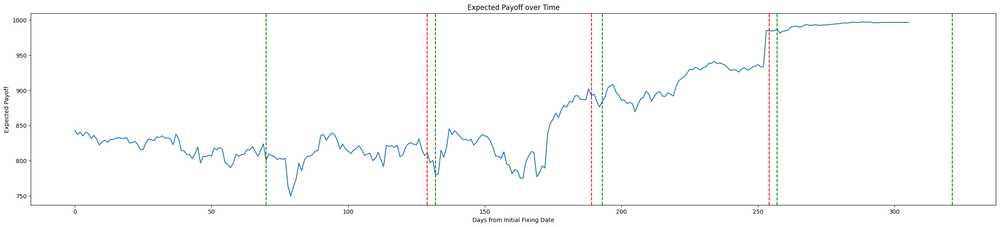

In [152]:
payout_heston = []
heston_payoff.current_date = 0
t = 0
historical_prices = torch.tensor(historical_prices).to(device)

for j in range(317, 317 - len(historical_prices), -1):
    s0 = historical_prices[t, :]
    t += 1
    historical_data = historical_prices[:t].unsqueeze(0).repeat(M, 1, 1).transpose(1, 2)
    heston_payoff.current_date += 1
    sobol = torch.quasirandom.SobolEngine(3 * 2 * j)
    uni = sobol.draw(M).reshape(M, 3, -1, 2).to(device)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    path = heston.multi_asset_path(u, uni, params, r, cov, s0)
    path = torch.cat([torch.log(torch.tensor(historical_data)), path[:,:,:,0]], dim=2)
    expected_payoff = heston_payoff.evaluate_payoff(path, True).nanmean()
    payout_heston.append(expected_payoff.item())

plot_backtest_results(payout_heston)

C:\Users\JHong\AppData\Local\Temp\ipykernel_33932\3038897186.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.cat([torch.log(torch.tensor(historical_data)), path[:,:,:,0]], dim=2)
c:\Users\JHong\Documents\GitHub\MH4518\payoff.py:72: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.tensor(path).to(device)


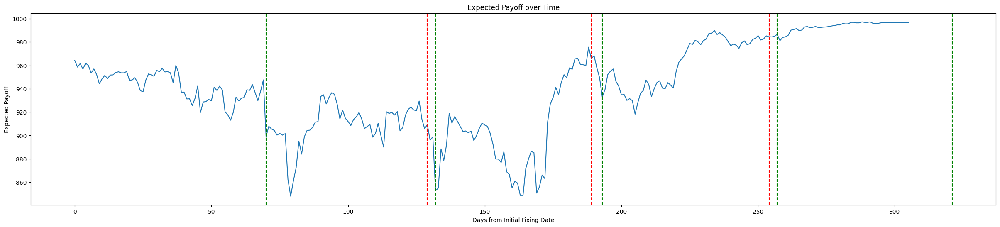

In [153]:
payout_heston_nc = []
heston_payoff.current_date = 0
t = 0
for j in range(317, 317 - len(historical_prices), -1):
    s0 = historical_prices[t, :]
    t += 1
    historical_data = historical_prices[:t].unsqueeze(0).repeat(M, 1, 1).transpose(1, 2)
    heston_payoff.current_date += 1
    sobol = torch.quasirandom.SobolEngine(3 * 2 * j)
    uni = sobol.draw(M).reshape(M, 3, -1, 2).to(device)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    path = heston.multi_asset_path(u, uni, params, r, cov, s0)
    path = torch.cat([torch.log(torch.tensor(historical_data)), path[:,:,:,0]], dim=2)
    expected_payoff = heston_payoff.evaluate_payoff(path, False).nanmean()
    payout_heston_nc.append(expected_payoff.item())

plot_backtest_results(payout_heston_nc)

### Under DCC-GARCH Model

In [52]:
m = 317
garch_payoff = CallablePayoff(0, r=0.0419, S0=S0.clone().detach())

epochs = 500
with tqdm(total=epochs, desc="Training Progress") as pbar:
    for epoch in range(epochs):
        path = garch.forecast(steps=m, num_paths=1000, s0=S0.cpu()) # 317 business days from initial fixing to final fixing
        path = np.log(np.clip(path, a_min=1e-10, a_max=None)) # in asset, timestep, path
        # (path #, asset #, timestep #)
        losses = garch_payoff.minimise_over_path(path)
        pbar.set_postfix({'Worst loss': max(losses), 
                            'Best Loss': min(losses)})
        pbar.update(1)


c:\Users\JHong\Documents\GitHub\MH4518\payoff.py:52: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.S0 = torch.log(torch.tensor(S0)).to(device) # In order of UNH, PFE, MRK
Training Progress:   0%|          | 0/500 [00:00<?, ?it/s]

C:\Users\JHong\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\scipy\stats\_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)
Training Progress:   0%|          | 1/500 [00:00<06:11,  1.34it/s, Worst loss=2.94e+5, Best Loss=8.01e+4]C:\Users\JHong\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\scipy\stats\_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)
Training Progress:   0%|          | 2/500 [00:01<06:08,  1.35it/s, Worst loss=2.33e+5, Best Loss=7.07e+4]C:\Users\JHong\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\scipy\stats\_qmc.py:958: UserWarning: The balance properties of Sobol

In [54]:
path = garch.forecast(steps=m, num_paths=M, s0=S0.cpu())
path = np.log(path) 
returns = garch_payoff.evaluate_payoff(path, True)
print(f"Expected Payoff: {x.mean()}")

C:\Users\JHong\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\scipy\stats\_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


Expected Payoff: 1032.2444095517571


C:\Users\JHong\AppData\Local\Temp\ipykernel_33932\1096211678.py:2: RuntimeWarning: divide by zero encountered in log
  path = np.log(path)


In [55]:
path = garch.forecast(steps=m, num_paths=M, s0=S0.cpu())
path = np.log(path)
returns = garch_payoff.evaluate_payoff(path, False)
print(f"Expected Payoff: {x.mean()}")

C:\Users\JHong\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\scipy\stats\_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


Expected Payoff: 1032.2444095517571


C:\Users\JHong\AppData\Local\Temp\ipykernel_33932\4121742091.py:2: RuntimeWarning: divide by zero encountered in log
  path = np.log(path)


C:\Users\JHong\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\scipy\stats\_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)
C:\Users\JHong\AppData\Local\Temp\ipykernel_33932\1006670655.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.cat([torch.tensor(historical_data), path], dim=2)
c:\Users\JHong\Documents\GitHub\MH4518\payoff.py:72: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.tensor(path).to(device)
C:\Users\JHong\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\Loc

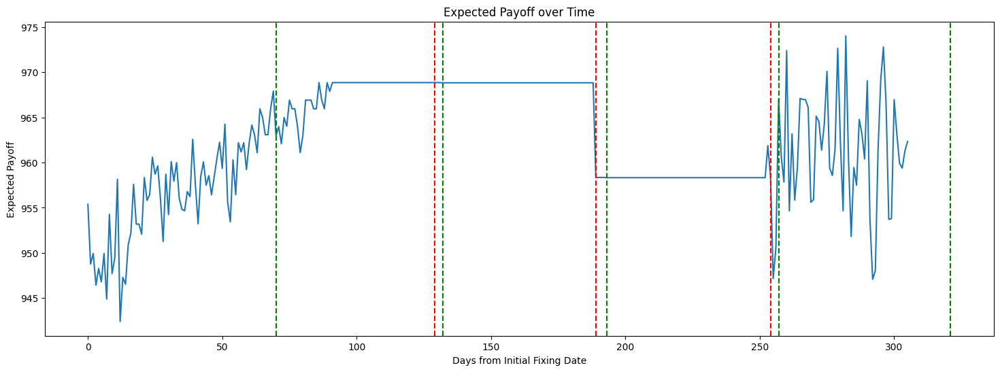

In [88]:
payout_garch = []
garch_payoff.current_date = 0
t = 0
for j in range(317, 317 - len(historical_prices), -1):
    s0 = historical_prices[t, :]
    t += 1
    historical_data = historical_prices[:t].unsqueeze(0).repeat(M, 1, 1).transpose(1, 2).to(device)
    garch_payoff.current_date += 1
    path = garch.forecast(steps=m, num_paths=M, s0=S0.cpu())
    path = torch.tensor(path).to(device)
    path = torch.cat([torch.tensor(historical_data), path], dim=2)
    paht = torch.log(path)
    expected_payoff = garch_payoff.evaluate_payoff(path, True).mean()
    payout_garch.append(expected_payoff.item())

plot_backtest_results(payout_garch)

C:\Users\JHong\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\scipy\stats\_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)
C:\Users\JHong\AppData\Local\Temp\ipykernel_33932\830876708.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.cat([torch.tensor(historical_data), path], dim=2)
c:\Users\JHong\Documents\GitHub\MH4518\payoff.py:72: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.tensor(path).to(device)
C:\Users\JHong\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\Loca

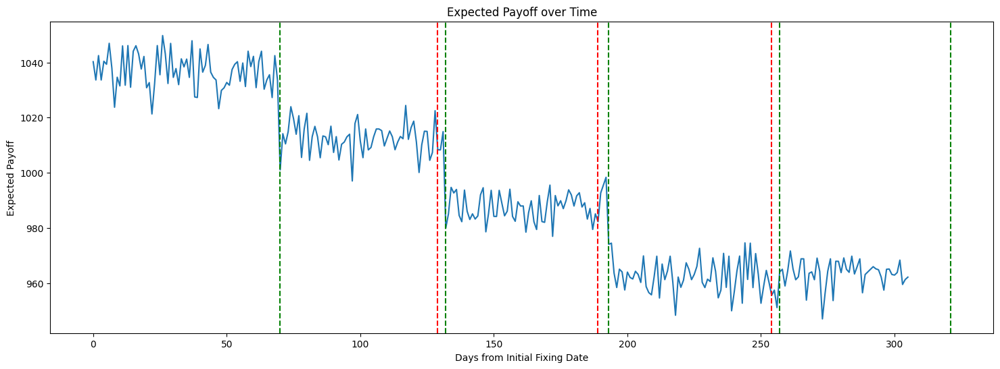

In [89]:
payout_garch_nc = []
garch_payoff.current_date = 0
t = 0
for j in range(317, 317 - len(historical_prices), -1):
    s0 = historical_prices[t, :]
    t += 1
    historical_data = historical_prices[:t].unsqueeze(0).repeat(M, 1, 1).transpose(1, 2).to(device)
    garch_payoff.current_date += 1
    path = garch.forecast(steps=m, num_paths=M, s0=S0.cpu())
    path = torch.tensor(path).to(device)
    path = torch.cat([torch.tensor(historical_data), path], dim=2)
    paht = torch.log(path)
    expected_payoff = garch_payoff.evaluate_payoff(path, False).mean()
    payout_garch_nc.append(expected_payoff.item())

plot_backtest_results(payout_garch_nc)

### Payoff Comparison

In [ ]:
start_analysis_date="2024-08-01"
start_analysis_date = pd.to_datetime(start_analysis_date).strftime("%Y-%m-%d")
# Find the index of the start_analysis_date in the asset data
start_analysis_index = asset_1.loc[asset_1["Date"] == start_analysis_date].index[0]

end_analysis_date="2024-10-30"
end_analysis_date = pd.to_datetime(end_analysis_date).strftime("%Y-%m-%d")
# Find the index of the end_analysis_date in the asset data
end_analysis_index = asset_1.loc[asset_1["Date"] == end_analysis_date].index[0]

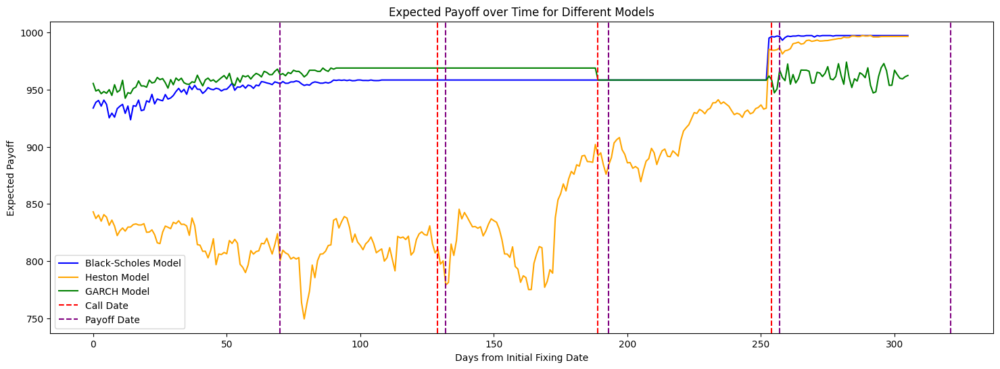

In [156]:
# Plot the expected payoffs for each model
plt.figure(figsize=(18, 6))
plt.plot(payout_bs, label="Black-Scholes Model", color='blue')
plt.plot(payout_heston, label="Heston Model", color='orange')
plt.plot(payout_garch, label="GARCH Model", color='green')

# Mark call dates and payoff dates
for i, calling_date in enumerate(calling_dates):
    if i == 0: plt.axvline(x=calling_date, color='red', linestyle='--', label='Call Date')
    else: plt.axvline(x=calling_date, color='red', linestyle='--')
for i, payoff_date in enumerate(payoff_dates):
    if i == 0: plt.axvline(x=payoff_date, color='purple', linestyle='--', label='Payoff Date')
    else: plt.axvline(x=payoff_date, color='purple', linestyle='--')

plt.xlabel("Days from Initial Fixing Date")
plt.ylabel("Expected Payoff")
plt.title("Expected Payoff over Time for Different Models")
plt.legend()
plt.show()

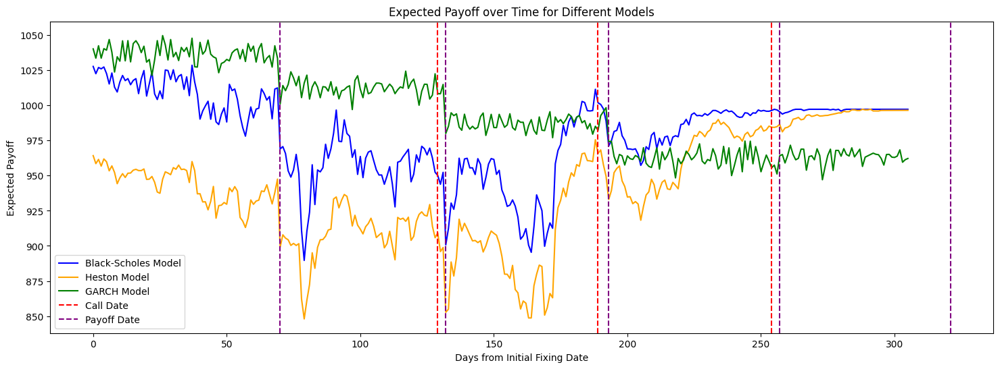

In [157]:
# Plot the expected payoffs for each model
plt.figure(figsize=(18, 6))
plt.plot(payout_bs_nc, label="Black-Scholes Model", color='blue')
plt.plot(payout_heston_nc, label="Heston Model", color='orange')
plt.plot(payout_garch_nc, label="GARCH Model", color='green')

# Mark call dates and payoff dates
for i, calling_date in enumerate(calling_dates):
    if i == 0: plt.axvline(x=calling_date, color='red', linestyle='--', label='Call Date')
    else: plt.axvline(x=calling_date, color='red', linestyle='--')
for i, payoff_date in enumerate(payoff_dates):
    if i == 0: plt.axvline(x=payoff_date, color='purple', linestyle='--', label='Payoff Date')
    else: plt.axvline(x=payoff_date, color='purple', linestyle='--')

plt.xlabel("Days from Initial Fixing Date")
plt.ylabel("Expected Payoff")
plt.title("Expected Payoff over Time for Different Models")
plt.legend()
plt.show()

# Choosing the best model :)

### Under Black-Scholes Model

In [96]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0.cpu())
path = np.log(path) 
path = path.transpose(2, 0, 1)
returns = bs_payoff.evaluate_payoff(path, True)
theta_bs = returns.nanmean()
print(f"Expected Payoff: {theta_bs}")

Expected Payoff: 949.353496001295


In [97]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0.cpu())
path = np.log(path) 
path = path.transpose(2, 0, 1)
returns = bs_payoff.evaluate_payoff(path, True)
var_bs = (1 / (M//2 - 1)) * (((returns[:M//2] + returns[M//2:]) / 2 - theta_bs) ** 2).sum()
print(f"Unbiased Variance under Black-Scholes: {var_bs}")

Unbiased Variance under Black-Scholes: 7847.798185969542


In [98]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0.cpu())
path = np.log(path) 
path = path.transpose(2, 0, 1)
returns = bs_payoff.evaluate_payoff(path, False)
theta_bs = returns.nanmean()
print(f"Expected Payoff: {theta_bs}")

Expected Payoff: 956.253257797665


In [99]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0.cpu())
path = np.log(path) 
path = path.transpose(2, 0, 1)
returns = bs_payoff.evaluate_payoff(path, False)
var_bs = (1 / (M//2 - 1)) * (((returns[:M//2] + returns[M//2:]) / 2 - theta_bs) ** 2).sum()
print(f"Unbiased Variance under Black-Scholes: {var_bs}")

Unbiased Variance under Black-Scholes: 7257.746428219732


### Under Heston Model

In [212]:
import matplotlib.pyplot as plt

def plot_final_step_histogram(simulated_data, show_barrier=True, inital=None, asset_labels=["UNH", "PFE", "MRK"]):
    if simulated_data is None:
        raise ValueError('No simulated data available. Run the simulation first.')

    p, m, M = simulated_data.shape  # p: number of assets, m: time steps, M: number of paths

    # Ensure barrier is provided and matches the number of assets
    if show_barrier and barrier is None:
        raise ValueError("Barrier values must be provided if show_barrier is True.")
    if barrier is not None and len(barrier) != p:
        raise ValueError("Barrier length must match the number of assets.")

    # Create subplots for each asset's histogram at the final time step
    fig, axes = plt.subplots(p, 1, figsize=(10, 5 * p), dpi=80)

    for i in range(p):
        ax = axes[i] if p > 1 else axes  # Select the appropriate axis if p > 1
        
        # Extract prices at the final time step for asset i
        final_prices = simulated_data[i, -1, :]  # Last time step for asset i
        
        # Plot histogram of final prices
        ax.hist(final_prices, bins=30, alpha=0.7, color='blue', label=f'{asset_labels[i]} Final Prices')
        
        if show_barrier:
            # Plot barrier line
            ax.axvline(x=inital[i], color='black', linestyle='--', label='Initial Value')
            ax.axvline(x=0.59 * inital[i], color='red', linestyle='--', label='Barrier')
            ax.annotate(f'{inital[i]:.2f}', xy=(inital[i], 0),
                        xytext=(10, 10), textcoords='offset points',
                        color='red', fontsize=10, va='center', ha='right')
            ax.annotate(f'{0.59 * inital[i]:.2f}', xy=(0.59 * inital[i], 0),
                        xytext=(10, 10), textcoords='offset points',
                        color='red', fontsize=10, va='center', ha='right')
        
        # Titles and labels
        ax.set_title(f'Histogram of Final Prices for Asset: {asset_labels[i]}')
        ax.set_xlabel('Price')
        ax.set_ylabel('Frequency')
        ax.legend()

    plt.tight_layout()
    plt.show()


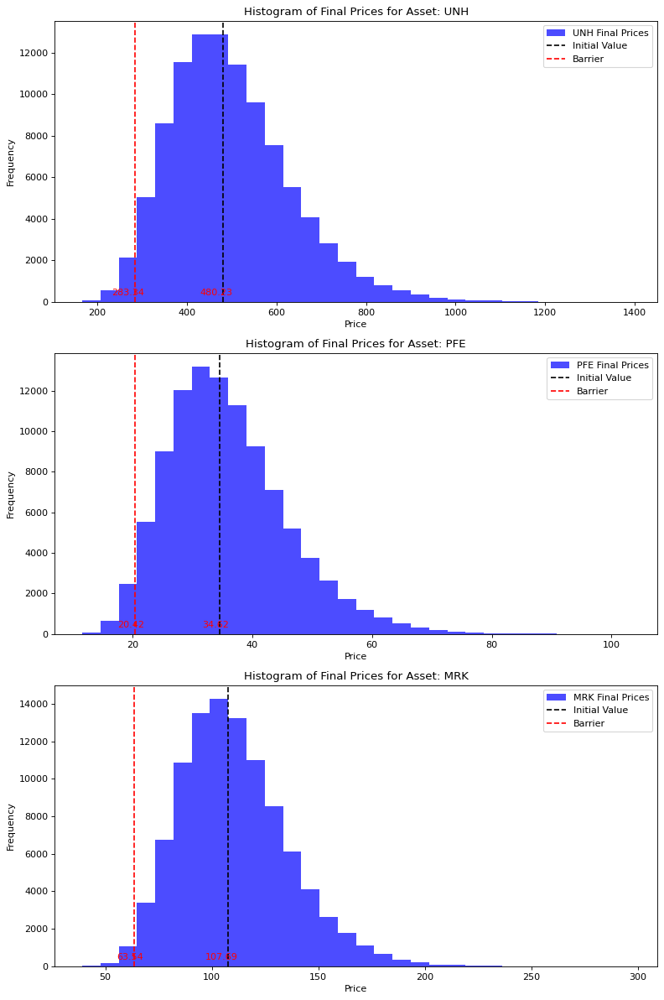

In [213]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0.cpu())

plot_final_step_histogram(path, True, S0.cpu())

In [207]:
M = 100_000
S0 = S0.clone().detach()
uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0)
path = path[1:,:,:,:]
returns = heston_payoff.evaluate_payoff(path[:,:,:,0], True)
theta_heston = returns.nanmean()
print(f"Expected Payoff: {theta_heston}")

returns = returns[~returns.isnan()]
var_heston = torch.var(returns-theta_heston)
print(f"Unbiased Variance under Heston: {var_heston}")

Expected Payoff: 883.7164236455034
Unbiased Variance under Heston: 38853.022147626296


c:\Users\JHong\Documents\GitHub\MH4518\payoff.py:72: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.tensor(path).to(device)


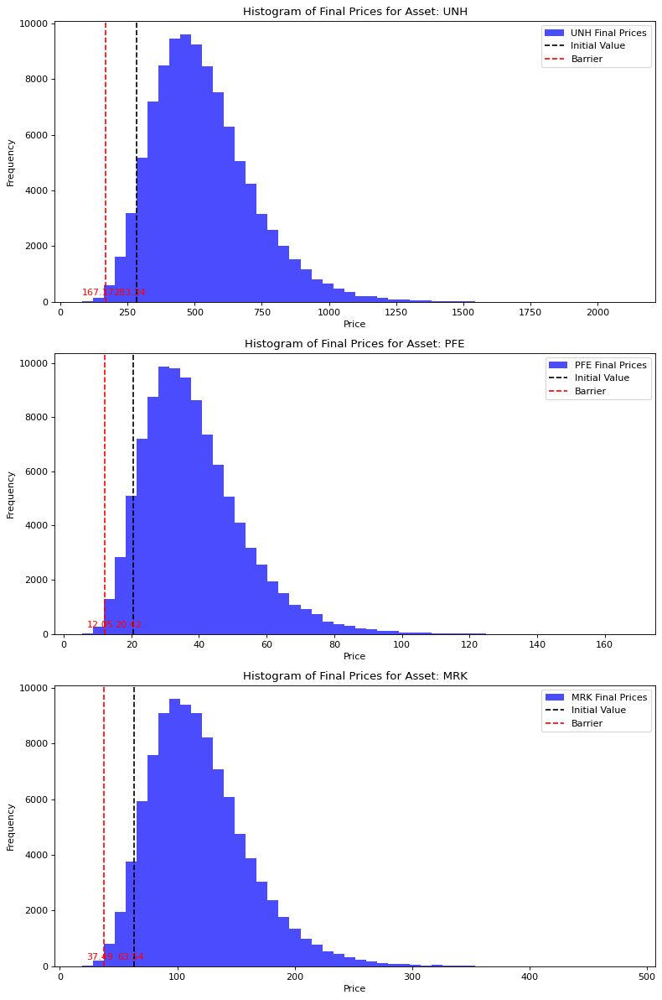

In [208]:
plot_final_step_histogram(torch.exp(path[1:,:,:,0].permute(1, 2, 0).cpu().detach()), True, barrier)

In [172]:
S0 = S0.clone().detach()
uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0)
returns = heston_payoff.evaluate_payoff(path[:,:,:,0], False)
theta_heston = returns.nanmean()
print(f"Expected Payoff: {theta_heston}")

returns = returns[~returns.isnan()]
var_heston = torch.var(returns-theta_heston)
print(f"Unbiased Variance under Heston: {var_heston}")

Expected Payoff: 883.3343564570582
Unbiased Variance under Heston: 39019.92790239464


### Under DCC-GARCH Model

In [173]:
path = garch.forecast(steps=m, num_paths=M, s0=S0.cpu())
path = torch.tensor(np.log(path))
returns = garch_payoff.evaluate_payoff(path, True)
theta_garch = returns.nanmean()
print(f"Expected Payoff: {theta_garch}")

returns = returns[~returns.isnan()]
var_garch = torch.var(returns-theta_garch)
print(f"Unbiased Variance under GARCH: {var_garch}")
print(f"Unbiased sd under GARCH: {torch.sqrt(var_garch)}")

C:\Users\JHong\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\scipy\stats\_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)
C:\Users\JHong\AppData\Local\Temp\ipykernel_33932\3504955350.py:2: RuntimeWarning: divide by zero encountered in log
  path = torch.tensor(np.log(path))
c:\Users\JHong\Documents\GitHub\MH4518\payoff.py:72: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.tensor(path).to(device)


Expected Payoff: 788.05718869151
Unbiased Variance under GARCH: 88831.99195482962
Unbiased sd under GARCH: 298.0469626666738


In [104]:
path = garch.forecast(steps=m, num_paths=M, s0=S0.cpu())
path = torch.tensor(np.log(path))
returns = garch_payoff.evaluate_payoff(path, False)
theta_garch = returns.nanmean()
print(f"Expected Payoff: {theta_garch}")

returns = returns[~returns.isnan()]
var_garch = torch.var((returns-theta_garch)**2)
print(f"Unbiased Variance under GARCH: {var_garch}")

C:\Users\JHong\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\scipy\stats\_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


Expected Payoff: 764.1745176413363
Unbiased Variance under GARCH: 12175838690.055746


C:\Users\JHong\AppData\Local\Temp\ipykernel_33932\4165699245.py:2: RuntimeWarning: divide by zero encountered in log
  path = torch.tensor(np.log(path))
c:\Users\JHong\Documents\GitHub\MH4518\payoff.py:72: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.tensor(path).to(device)


In [244]:
import numpy as np
import torch

def mask_out_of_range(simulated_data, initial_levels, lower_clip=0.5, upper_clip=1.5):
    """
    Masks values in simulated_data that fall outside the specified range of initial levels for each asset.

    Parameters:
        simulated_data (torch.Tensor or np.ndarray): Simulated asset prices with shape (num_paths, num_assets, num_steps).
        initial_levels (list or array): Initial levels for each asset with shape (num_assets,).
        lower_clip (float): Lower clip factor as a fraction of initial levels (e.g., 0.5 for 50%).
        upper_clip (float): Upper clip factor as a fraction of initial levels (e.g., 1.5 for 150%).

    Returns:
        masked_data: Simulated data with values outside the specified range set to NaN.
    """
    # Ensure data is a torch tensor for compatibility
    if isinstance(simulated_data, np.ndarray):
        simulated_data = torch.tensor(simulated_data, dtype=torch.float32)
    
    # Convert initial levels to a tensor and calculate lower and upper thresholds for each asset
    initial_levels_tensor = torch.tensor(initial_levels, dtype=simulated_data.dtype, device=simulated_data.device)
    lower_thresholds = lower_clip * initial_levels_tensor  # Shape (num_assets,)
    upper_thresholds = upper_clip * initial_levels_tensor  # Shape (num_assets,)
    
    # Expand thresholds to match simulated_data dimensions for broadcasting
    lower_thresholds_expanded = lower_thresholds.unsqueeze(0).unsqueeze(-1)  # Shape (1, num_assets, 1)
    upper_thresholds_expanded = upper_thresholds.unsqueeze(0).unsqueeze(-1)  # Shape (1, num_assets, 1)
    
    # Mask values outside the range by setting them to NaN
    masked_data = simulated_data.clone()
    masked_data[(masked_data < lower_thresholds_expanded) | (masked_data > upper_thresholds_expanded)] = float('nan')
    
    return masked_data

# Example usage:
# masked_data = mask_out_of_range(simulated_data, initial_levels=[initial_UNH, initial_PFE, initial_MRK], lower_clip=0.5, upper_clip=1.5)


In [245]:
x = mask_out_of_range(path, S0)
x

C:\Users\JHong\AppData\Local\Temp\ipykernel_33932\3586831357.py:22: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  initial_levels_tensor = torch.tensor(initial_levels, dtype=simulated_data.dtype, device=simulated_data.device)


tensor([[[nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan]],

        [[nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan]],

        [[nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan]],

        ...,

        [[nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan]],

        [[nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan]],

        [[nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan],
         [nan, nan, nan,  ..., nan, nan, nan]]], dtype=torch.float32)

In [246]:
x = x[~torch.isnan(x)]
x

tensor([], dtype=torch.float32)

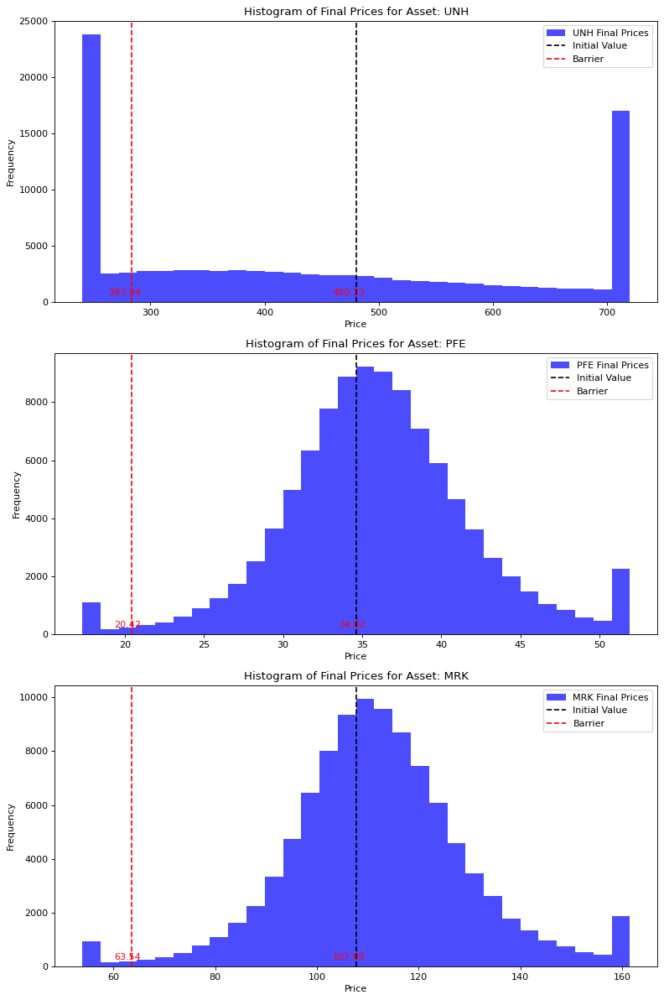

In [232]:
plot_final_step_histogram(x.permute((1,2,0)), True, S0.cpu())

C:\Users\JHong\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\scipy\stats\_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


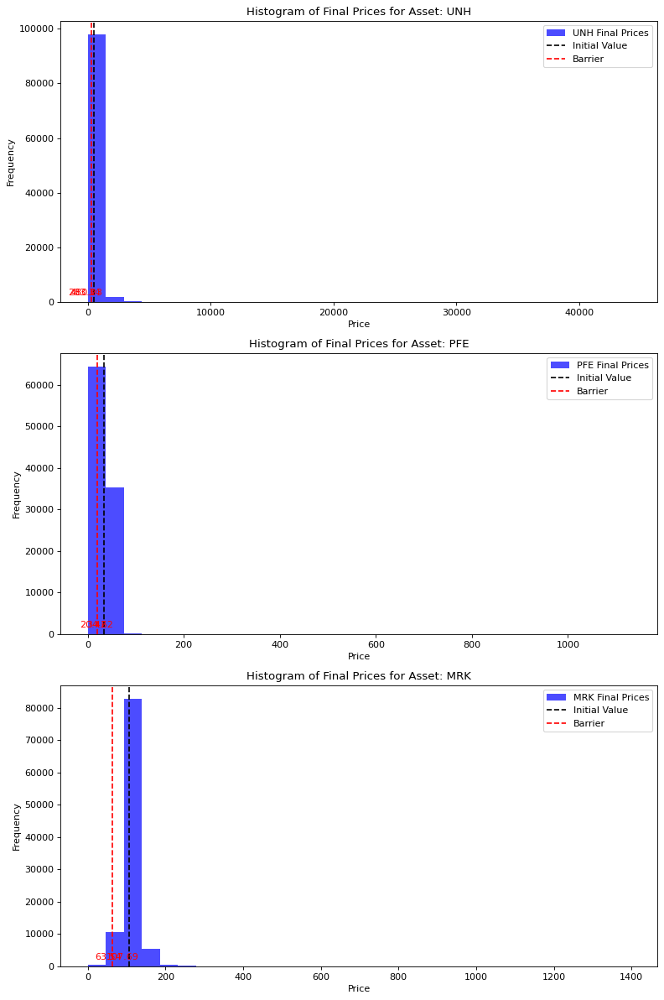

In [220]:
path = garch.forecast(steps=m, num_paths=M, s0=S0.cpu())
plot_final_step_histogram(path.transpose((1,2,0)), True, S0.cpu())

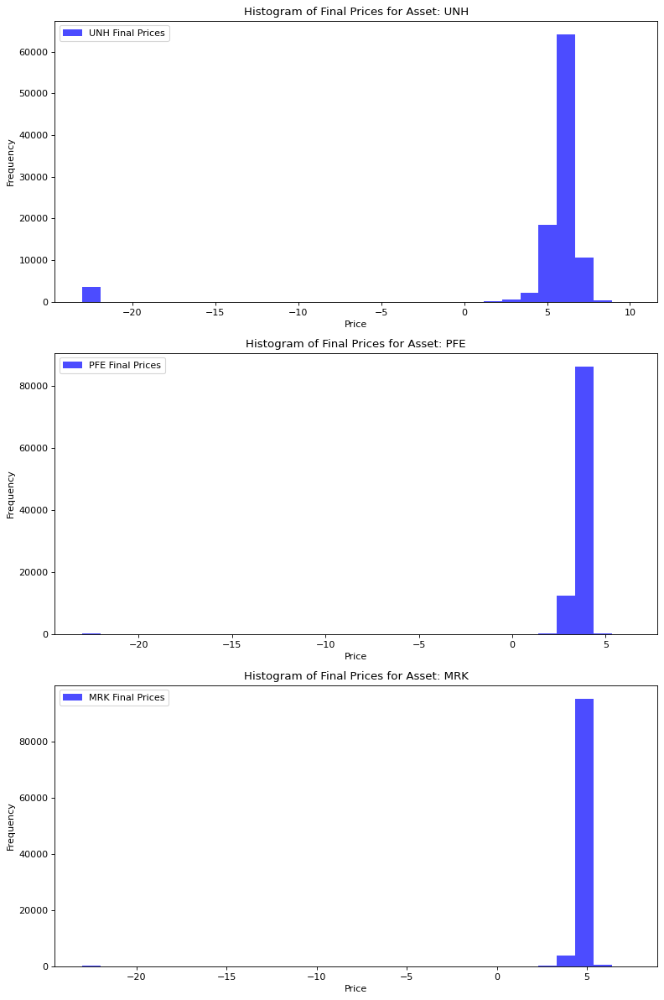

In [219]:
plot_final_step_histogram(np.log(np.clip(path, a_min=1e-10, a_max=None)).transpose((1,2,0)), False, S0.cpu())

# Portfolio Optimization

### Under Black-Scholes Model

In [174]:
delta = multi_bs.calculate_delta(pay_off=bs_payoff, m=317, M=M, h=0.01, S0=S0.cpu().numpy())
gamma = multi_bs.calculate_gamma(pay_off=bs_payoff, m=317, M=M, h=0.01, S0=S0.cpu().numpy())
print(f"Delta: {delta}, \nGamma: \n{gamma}")

Delta: [0.36536479 5.66327501 0.718489  ], 
Gamma: 
[[-0.01120294  0.06081892 -0.04628313]
 [-0.03210322  2.30507757 -0.33556836]
 [-0.03192151  0.2755654  -0.09461718]]


### Under Heston Model

In [ ]:
delta = torch.empty(3)
for i in range(3):
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 1.01
    
    up_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)
    up_payoff = heston_payoff.evaluate_payoff(up_paths[:,:,:,0]).nanmean()
        
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 0.99
    
    down_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)
    down_payoff = heston_payoff.evaluate_payoff(down_paths[:,:,:,0]).nanmean()
    
    delta[i] = (up_payoff - down_payoff) / 0.02 / s0[i]
print('Payoff delta:', delta.tolist())

# Find gamma
gamma = torch.empty((3,3))
for i in range(3):
    for j in range(3):
        
        uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
        av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
        uni = torch.cat((uni, av), dim=0)
        u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
        
        s0_temp = s0
        s0_temp[i] *= 1.01
        s0_temp[j] *= 1.01
        
        up1_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)
        up1_payoff = heston_payoff.evaluate_payoff(up_paths[:,:,:,0]).nanmean()
            
        uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
        av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
        uni = torch.cat((uni, av), dim=0)
        u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
        
        s0_temp = s0
        s0_temp[i] *= 1.01
        s0_temp[j] *= 0.99
        
        down1_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)
        down1_payoff = heston_payoff.evaluate_payoff(down_paths[:,:,:,0]).nanmean()
            
        uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
        av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
        uni = torch.cat((uni, av), dim=0)
        u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
        
        s0_temp = s0
        s0_temp[i] *= 0.99
        s0_temp[j] *= 1.01
        
        down2_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)
        down2_payoff = heston_payoff.evaluate_payoff(down_paths[:,:,:,0]).nanmean()
        
        uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
        av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
        uni = torch.cat((uni, av), dim=0)
        u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
        
        s0_temp = s0
        s0_temp[i] *= 0.99
        s0_temp[j] *= 0.99
        
        up2_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)
        up2_payoff = heston_payoff.evaluate_payoff(up_paths[:,:,:,0]).nanmean()
        
        gamma[i,j] = (up1_payoff - down1_payoff - down2_payoff + up2_payoff) / (4 * 0.01**2 * s0[i] * s0[j])
print('Payoff gamma:', gamma.tolist())

put_delta = torch.empty(3)
for i in range(3):
    
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 1.01
    
    up_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    up_put = torch.clamp(s0_temp[i]-up_paths[:,-1], 0).nanmean()
    
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 0.99
    
    down_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    down_put = torch.clamp(s0_temp[i]-down_paths[:,-1], 0).nanmean()
    
    put_delta[i] = (up_put - down_put) / 0.02 / s0[i]
print('Put delta:', put_delta.tolist())

put_gamma = torch.empty((3,3))
for i in range(3):
    
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 1.01
    
    up_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    up_put = torch.clamp(s0_temp[i]-up_paths[:,-1], 0).nanmean()
    
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    
    mid_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    mid_put = torch.clamp(s0_temp[i]-mid_paths[:,-1], 0).nanmean()
    
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 0.99
    
    down_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    down_put = torch.clamp(s0_temp[i]-down_paths[:,-1], 0).nanmean()
    
    put_delta[i] = (up_put - 2 * mid_put + down_put) / (0.04 * s0[i]**2)
print('Put gamma:', put_delta.tolist())

stock_delta = torch.empty(3)
for i in range(3):
    
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 1.01
    
    up_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    up_put = up_paths[:,-1].nanmean()
    
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 0.99
    
    down_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    down_put = down_paths[:,-1].nanmean()
    
    stock_delta[i] = (up_put - down_put) / 0.02 / s0[i]
print('Stock delta:', stock_delta.tolist())

### Under DCC-GARCH 

# Risk Analysis

### Under Black-Scholes Model

In [233]:
from helper import calculate_var_cvar
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0.cpu())
path = np.log(path) 
path = path.transpose(2, 0, 1)
returns = bs_payoff.evaluate_payoff(path, True)
var, cvar = calculate_var_cvar(returns.cpu(), confidence_level=0.95)
print(f"Value at Risk: {var.item()}, Conditional Value at Risk: {cvar}")

Value at Risk: 571.6371903293933, Conditional Value at Risk: 523.8504830917134


In [183]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0.cpu())
path = np.log(path) 
path = path.transpose(2, 0, 1)
returns = bs_payoff.evaluate_payoff(path, False)
var, cvar = calculate_var_cvar(returns.cpu(), confidence_level=0.95)
print(f"Value at Risk: {var.item()}, Conditional Value at Risk: {cvar}")

Value at Risk: 572.457298804518, Conditional Value at Risk: 524.6317563596597


### Under Heston Model

In [234]:
uni = sobol.draw(M).reshape(M,3,-1,2).cuda()
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0.cuda())
returns = heston_payoff.evaluate_payoff(path[:,:,:,0], True)
var, cvar = calculate_var_cvar(returns.cpu(), confidence_level=0.95)
print(f"Value at Risk: {var.item()}, Conditional Value at Risk: {cvar}")

Value at Risk: 474.09983673194716, Conditional Value at Risk: 413.634325081718


c:\Users\JHong\Documents\GitHub\MH4518\payoff.py:72: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.tensor(path).to(device)


In [187]:
uni = sobol.draw(M).reshape(M,3,-1,2).cuda()
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0.cuda())
returns = heston_payoff.evaluate_payoff(path[:,:,:,0], False)
var, cvar = calculate_var_cvar(returns.cpu(), confidence_level=0.95)
print(f"Value at Risk: {var.item()}, Conditional Value at Risk: {cvar}")

Value at Risk: 475.61729739847675, Conditional Value at Risk: 415.3507472794339


### Under DCC-GARCH Model

In [235]:
path = garch.forecast(steps=m, num_paths=M, s0=S0.cpu())
path = np.log(path) 
returns = garch_payoff.evaluate_payoff(path, True)
var, cvar = calculate_var_cvar(returns.cpu(), confidence_level=0.95)
print(f"Value at Risk: {var.item()}, Conditional Value at Risk: {cvar}")

C:\Users\JHong\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\scipy\stats\_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)
C:\Users\JHong\AppData\Local\Temp\ipykernel_33932\1601313894.py:2: RuntimeWarning: divide by zero encountered in log
  path = np.log(path)


Value at Risk: 137.80358790838602, Conditional Value at Risk: 61.212433701099584


In [ ]:
path = garch.forecast(steps=m, num_paths=M, s0=S0)
path = np.log(path) 
returns = garch_payoff.evaluate_payoff(path, False)
var, cvar = calculate_var_cvar(returns, confidence_level=0.95)
print(f"Value at Risk: {var.item()}, Conditional Value at Risk: {cvar}")